In [1]:
# Spatial Transcriptomic Data Analysis Tutorial

# Example Data:
# Hepatocellular carcinoma (HCC) resection specimens
# Publication link: https://pubmed.ncbi.nlm.nih.gov/37723590/

# Step1. Select and Download Dataset
# Step2. Load Data and Create singleCell Object
# Step3. Normalization; PCA; UMAP; Clustering; Visualization
# Step4. Marker Gene Identification; Cluster Specific; Sample Specific; or Any other Categories
# Step5. Cell Types Annotation using CellTypist
    # - Manual Inspection with Known Markers (Optional)
    # - Clustering-Based Validation (Optional)
    # - Use other methods like SingleR (for R) and Azimuth (Seurat-based in R) (Optional)
    # - Quantitive validation of different annotation methods (Optional)

# By: Ashok K. Sharma
# Date: 11-12-2024

In [2]:
# Set up the Environment
# Install and import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import time
#!pip3 install umap-learn
from umap import UMAP # this is installed by us
from sklearn.cluster import KMeans # For Clustering
import scanpy as sc

# set plot style
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set_context('talk')

np.set_printoptions(precision=2)
np.set_printoptions(suppress=True)

import warnings
warnings.filterwarnings("ignore")

In [3]:
#Step 1: Select and Download the Data (GSE238264)
# Data link: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE238264
# Download the Tar files for each sample (Total 7 Samples)
!ls GSE238264_RAW # Check the Samples

GSM7661255_HCC1R.tar.gz  GSM7661260_HCC6NR.tar.gz HCC4R
GSM7661256_HCC2R.tar.gz  GSM7661261_HCC7NR.tar.gz HCC5NR
GSM7661257_HCC3R.tar.gz  HCC1R                    HCC6NR
GSM7661258_HCC4R.tar.gz  HCC2R                    HCC7NR
GSM7661259_HCC5NR.tar.gz HCC3R


In [4]:
#Step 2: Create singleCell AnnData Object For 1 Sample at a Time
import scanpy as sc

## Define paths (adjust the paths based on your extracted folders)
#matrix_path = "GSE238264_RAW/HCC1R/filtered_feature_bc_matrix/matrix.mtx.gz"
#barcodes_path = "GSE238264_RAW/HCC1R/filtered_feature_bc_matrix/barcodes.tsv.gz"
#genes_path = "GSE238264_RAW/HCC1R/filtered_feature_bc_matrix/features.tsv.gz"  # or genes.tsv

# Define the path to the directory containing matrix, barcodes, and features files
matrix_dir = "GSE238264_RAW/HCC1R/filtered_feature_bc_matrix"

# Load the data
ad = sc.read_10x_mtx(
    path=matrix_dir,            # Folder with matrix, barcodes, and features files
    var_names="gene_symbols",   # Use gene symbols if available in features.tsv
    make_unique=True            # Avoids duplicate gene names
)

## Assuming coordinates are in columns 'x' and 'y' in the cell metadata
#if 'spatial' in ad.obs.columns:
#    ad.obsm['spatial'] = ad.obs[['x', 'y']].values
## You can repeat this process for each sample and then concatenate or merge AnnData objects

#########################################
# If spatial cordinates in a seperate file! Follow these steps
coords_path = "GSE238264_RAW/HCC1R/spatial/tissue_positions_list.csv"
# Load spatial coordinates
coords_df = pd.read_csv(coords_path, header=None, names=["barcode", "in_tissue", "array_row", "array_col", "x", "y"])
# Set barcodes as the index to match AnnData's obs index (assuming they align by barcode)
coords_df.set_index("barcode", inplace=True)

# Ensure AnnData's barcodes match the coordinate file
# Filter out any barcodes in AnnData that are not in the coordinate file
ad = ad[ad.obs.index.isin(coords_df.index), :]
# Reorder coords_df to match ad.obs.index order
coords_df = coords_df.loc[ad.obs.index]
# Add spatial coordinates to AnnData object
ad.obsm['spatial'] = coords_df[['x', 'y']].values
# Optionally, add tissue status or other metadata from coords_df
ad.obs[['in_tissue', 'array_row', 'array_col']] = coords_df[['in_tissue', 'array_row', 'array_col']]

# Extract the spatial coordinates and add them as columns in `ad.obs`
# Rename them to match what your plotting function expects
ad.obs['center_x'] = ad.obsm['spatial'][:, 0]  # x-coordinates
ad.obs['center_y'] = ad.obsm['spatial'][:, 1]  # y-coordinates
#########################################

print(ad.obs.head())   # Metadata for cells
print(ad.var.head())   # Metadata for genes
print(ad)

                    in_tissue  array_row  array_col  center_x  center_y
AAACAAGTATCTCCCA-1          1         50        102      1263      1492
AAACACCAATAACTGC-1          1         59         19      1460       442
AAACAGCTTTCAGAAG-1          1         43          9      1107       316
AAACAGGGTCTATATT-1          1         47         13      1196       367
AAACATGGTGAGAGGA-1          1         62          0      1525       202
                    gene_ids    feature_types
MIR1302-2HG  ENSG00000243485  Gene Expression
FAM138A      ENSG00000237613  Gene Expression
OR4F5        ENSG00000186092  Gene Expression
AL627309.1   ENSG00000238009  Gene Expression
AL627309.3   ENSG00000239945  Gene Expression
AnnData object with n_obs × n_vars = 3006 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'center_x', 'center_y'
    var: 'gene_ids', 'feature_types'
    obsm: 'spatial'


In [5]:
#Step 2: Create singleCell AnnData Object # Now in the Loop for All Samples
import scanpy as sc
import pandas as pd
import os
from pathlib import Path

# Define the root directory containing all samples
root_dir = "GSE238264_RAW"

# Example directory for one Sample
# matrix_dir = "GSE238264_RAW/HCC1R/filtered_feature_bc_matrix"

# Initialize an empty list to store AnnData objects for each sample
all_adatas = []

# Loop through each sample directory
for sample_folder in Path(root_dir).glob("*/filtered_feature_bc_matrix"):
    # Get the sample name from the folder path
    sample_name = sample_folder.parts[-2]  # Adjust if directory structure is different
    print(f"Processing sample: {sample_name}")  # Check sample name
    
    # Define paths for matrix, barcodes, and features files
    matrix_dir = sample_folder
    coords_path = sample_folder.parent / "spatial" / "tissue_positions_list.csv"
    
    # Load the data for the sample
    ad = sc.read_10x_mtx(
        path=matrix_dir,             # Folder with matrix, barcodes, and features files
        var_names="gene_symbols",    # Use gene symbols if available in features.tsv
        make_unique=True             # Avoids duplicate gene names
    )
    
    ## Add spatial coordinates if available in metadata (If not then follow below step to add Spatial Coordinate Manually)
    ## Assuming coordinates are in columns 'x' and 'y' in the cell metadata
    #if 'spatial' in ad.obs.columns:
    #    ad.obsm['spatial'] = ad.obs[['x', 'y']].values
    ## You can repeat this process for each sample and then concatenate or merge AnnData objects

    # Load spatial coordinates
    coords_df = pd.read_csv(coords_path, header=None, names=["barcode", "in_tissue", "array_row", "array_col", "x", "y"])
    coords_df.set_index("barcode", inplace=True)  # Set barcodes as index   
    # Filter and align AnnData object with spatial coordinates
    ad = ad[ad.obs.index.isin(coords_df.index), :]
    coords_df = coords_df.loc[ad.obs.index]  
    # Add spatial coordinates and other metadata to AnnData object
    ad.obsm['spatial'] = coords_df[['x', 'y']].values
    ad.obs[['in_tissue', 'array_row', 'array_col']] = coords_df[['in_tissue', 'array_row', 'array_col']]
    
    # Add sample name to obs for identification after concatenation
    ad.obs['sample'] = sample_name
    
    # Extract spatial coordinates into `ad.obs` for easier plotting if needed
    ad.obs['center_x'] = ad.obsm['spatial'][:, 0]
    ad.obs['center_y'] = ad.obsm['spatial'][:, 1]
    
    # Append the AnnData object to the list
    all_adatas.append(ad)

# Concatenate all AnnData objects into a single object
combined_ad = all_adatas[0].concatenate(*all_adatas[1:], batch_key="sample", batch_categories=[adata.obs['sample'][0] for adata in all_adatas])

# Verify the combined AnnData object
print(combined_ad)
print(combined_ad.obs.head())   # Metadata for cells
print(combined_ad.var.head())   # Metadata for genes
# Save the AnnData Object data
# combined_ad.write("data/GSE238264_AnnDataObject.h5ad") # Save the complete Model

###########################################
# Save Sample specific Ann Data Objects
# Get the list of unique sample names
output_folder = "data"
# Create the folder if it doesn't already exist
os.makedirs(output_folder, exist_ok=True)

sample_names = combined_ad.obs['sample'].unique()

# Loop through each sample and create a separate AnnData object, then save it
for sample in sample_names:
    # Subset the combined AnnData object for the current sample
    sample_ad = combined_ad[combined_ad.obs['sample'] == sample].copy()
    
    # Define a filename for saving
    #filename = f"{sample}_adata.h5ad"
    filename = os.path.join(output_folder, f"{sample}_adata.h5ad")
    
    # Save the sample-specific AnnData object
    sample_ad.write(filename)
    print(f"Saved {filename}")
###########################################

Processing sample: HCC5NR
Processing sample: HCC6NR
Processing sample: HCC2R
Processing sample: HCC1R
Processing sample: HCC7NR
Processing sample: HCC3R
Processing sample: HCC4R
AnnData object with n_obs × n_vars = 17292 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'center_x', 'center_y'
    var: 'gene_ids', 'feature_types'
    obsm: 'spatial'
                           in_tissue  array_row  array_col  sample  center_x  \
AAACAGAGCGACTCCT-1-HCC5NR          1         14         94  HCC5NR       458   
AAACAGCTTTCAGAAG-1-HCC5NR          1         43          9  HCC5NR      1095   
AAACAGGGTCTATATT-1-HCC5NR          1         47         13  HCC5NR      1183   
AAACCGGGTAGGTACC-1-HCC5NR          1         42         28  HCC5NR      1073   
AAACCTCATGAAGTTG-1-HCC5NR          1         37         19  HCC5NR       963   

                           center_y  
AAACAGAGCGACTCCT-1-HCC5NR      1380  
AAACAGCTTTCAGAAG-1-HCC5NR       304  
AAACAGGGTCTATATT-1-HCC5NR       355  


In [6]:
## Alternative way to load data for multiple samples (Completely Optional)
## For some spatial transcriptomics datasets, like those from the 10x Genomics Visium platform, there are specialized functions to handle spatial data:
#HCC1R_ad = sc.read_visium("GSE238264_RAW/HCC1R")
#HCC2R_ad = sc.read_visium("GSE238264_RAW/HCC2R")
#HCC3R_ad = sc.read_visium("GSE238264_RAW/HCC3R")
#HCC4R_ad = sc.read_visium("GSE238264_RAW/HCC4R")
#HCC5NR_ad = sc.read_visium("GSE238264_RAW/HCC5NR")
#HCC6NR_ad = sc.read_visium("GSE238264_RAW/HCC6NR")
#HCC7NR_ad = sc.read_visium("GSE238264_RAW/HCC7NR")

## Assuming `ad1`, `ad2`, etc., are AnnData objects for each sample
#combined_ad = HCC1R_ad.concatenate(
#    HCC2R_ad, HCC3R_ad, HCC4R_ad, HCC5NR_ad, HCC6NR_ad, HCC7NR_ad, 
#    index_unique=None
#)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


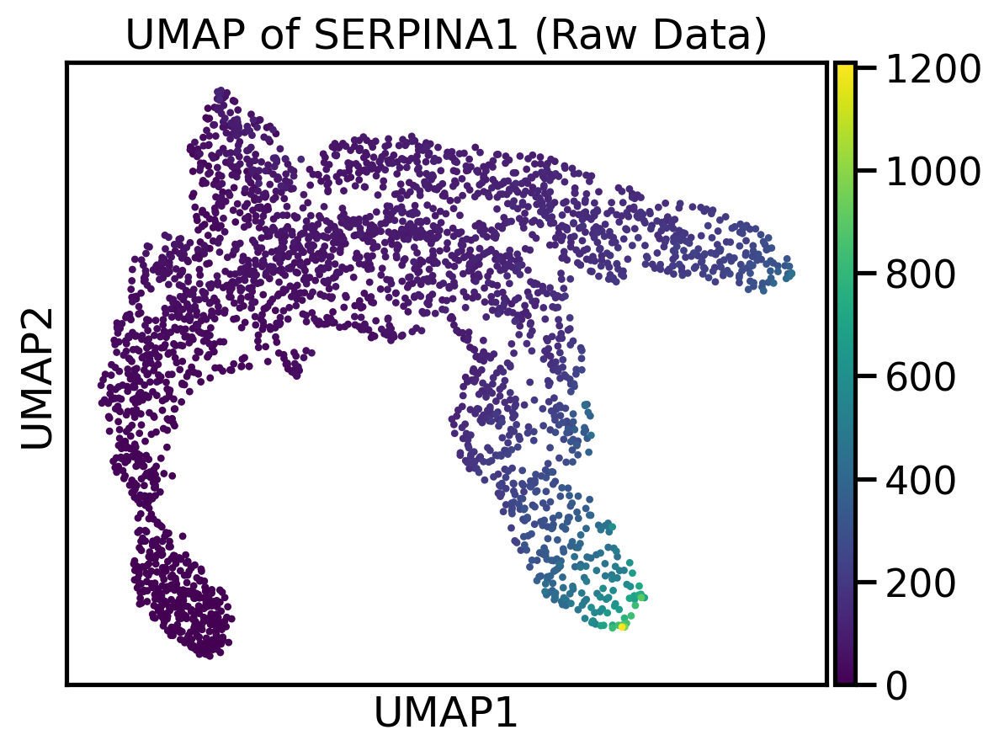

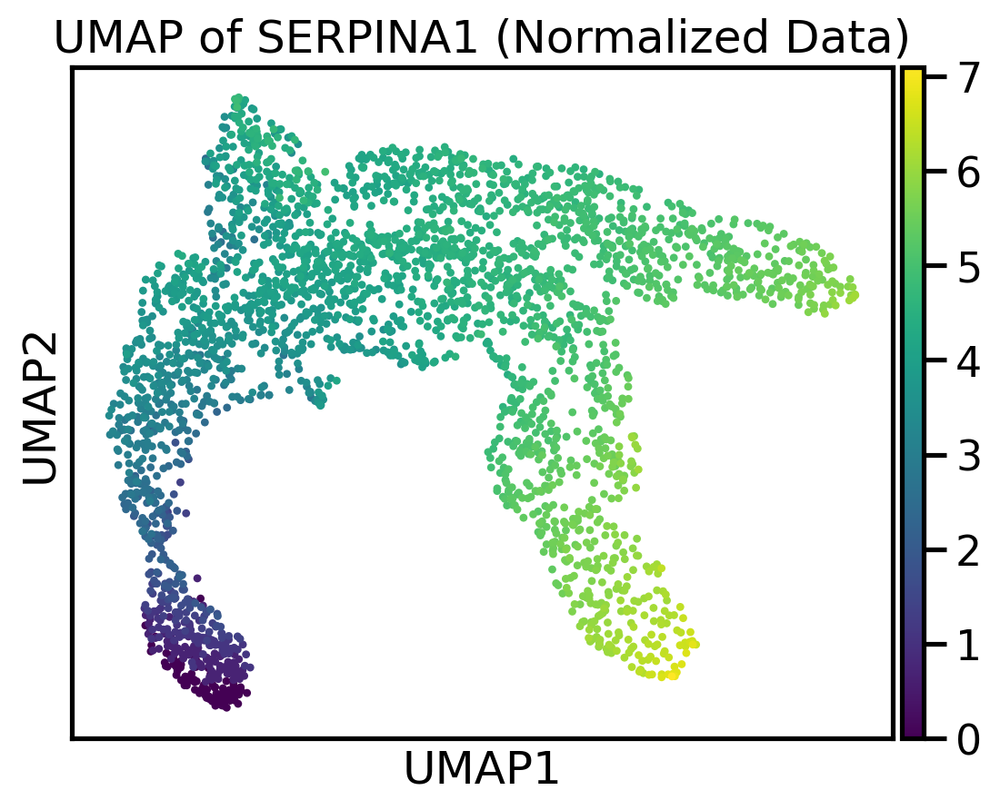

In [7]:
# Before going to the next Step: First Check 
# Why normalization is important - Just for demonstration
HCC1R_ad = combined_ad[combined_ad.obs['sample'] == "HCC1R"].copy()

gene_of_interest = 'SERPINA1'  # Replace 'GeneX' with an actual gene in ad_viz.var_names

# UMAP projection
sc.pp.neighbors(HCC1R_ad, n_neighbors=10, n_pcs=40)  # You can adjust n_neighbors and n_pcs
sc.tl.umap(HCC1R_ad)
# Plot UMAP for the raw data
sc.pl.umap(HCC1R_ad, color=gene_of_interest, title=f"UMAP of {gene_of_interest} (Raw Data)", show=True)

# Apply log1p normalization in-place on the AnnData object
sc.pp.log1p(HCC1R_ad)

# UMAP projection Again
sc.pp.neighbors(HCC1R_ad, n_neighbors=10, n_pcs=40)  # You can adjust n_neighbors and n_pcs
sc.tl.umap(HCC1R_ad)
# Plot UMAP for the normalized data
sc.pl.umap(HCC1R_ad, color=gene_of_interest, title=f"UMAP of {gene_of_interest} (Normalized Data)", show=True)

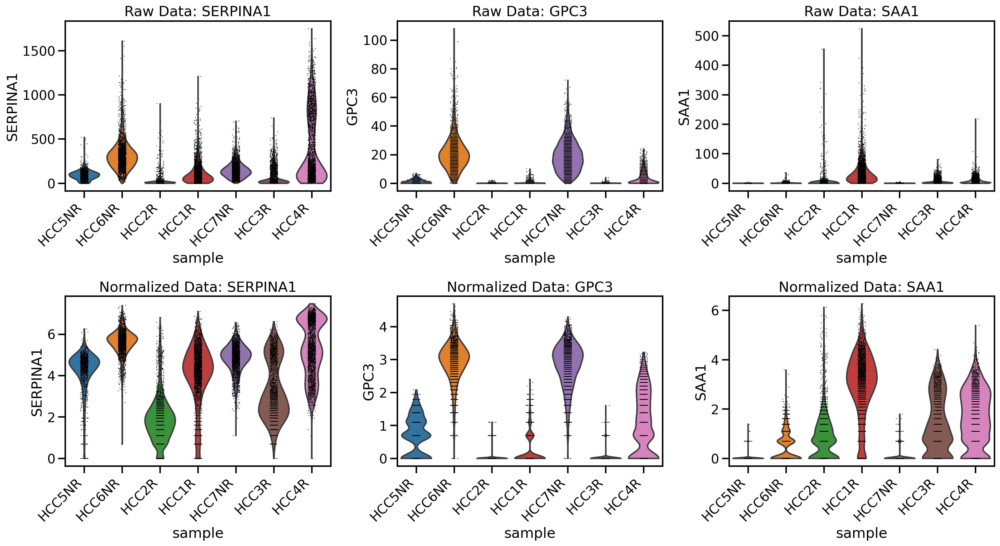

In [8]:
# Another Check for Normalization
# Check the expression of certain genes (Raw vs Normalized)
combined_ad = sc.read('data/GSE238264_AnnDataObject.h5ad') # Load the Data Again

combined_ad_raw = combined_ad.copy() # Create a deep copy of combined_ad as raw data
sc.pp.log1p(combined_ad) # # Normalizes combined_ad in-place, no need for combined_ad_norm: log1p normalization

# Define the genes and create a 2-row figure layout
genes = ['SERPINA1', 'GPC3', 'SAA1']
fig, axes = plt.subplots(2, len(genes), figsize=(18, 10))  # 2 rows for raw and normalized data

# Loop over each gene to plot it separately in the raw data
for idx, gene in enumerate(genes):
    sc.pl.violin(combined_ad_raw, keys=gene, groupby='sample', ax=axes[0, idx], show=False)
    axes[0, idx].set_title(f'Raw Data: {gene}')

# Loop over each gene to plot it separately in the normalized data
for idx, gene in enumerate(genes):
    sc.pl.violin(combined_ad, keys=gene, groupby='sample', ax=axes[1, idx], show=False)
    axes[1, idx].set_title(f'Normalized Data: {gene}')

# Rotate x-axis labels for both rows of plots
for row in axes:
    for ax in row:
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

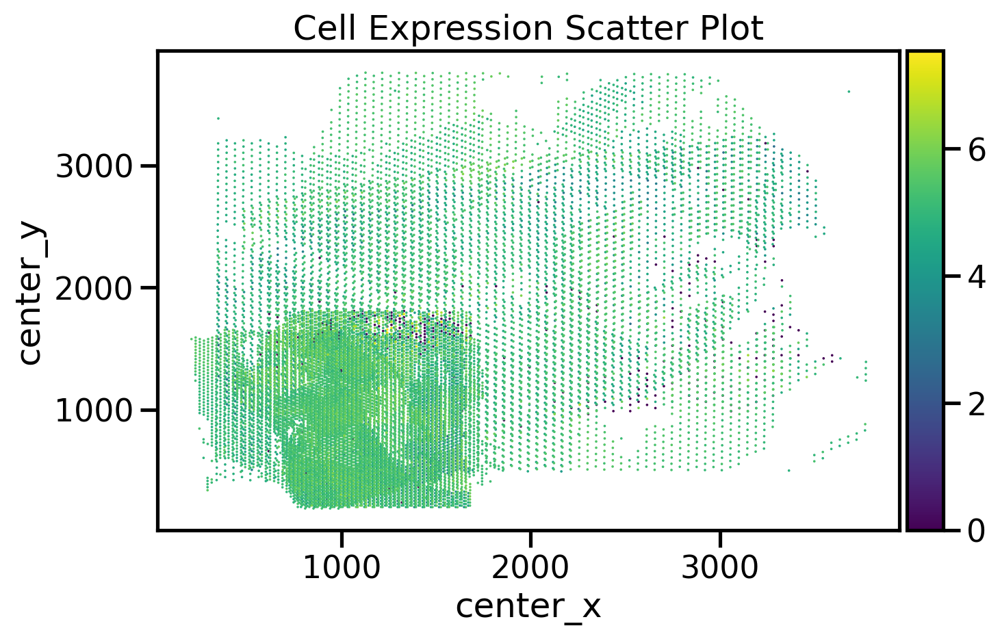

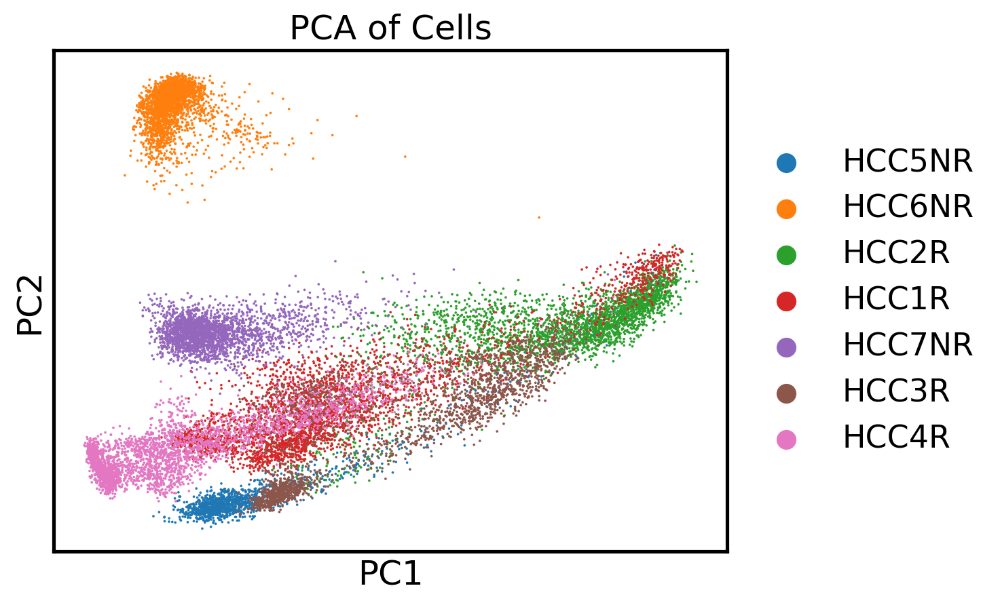

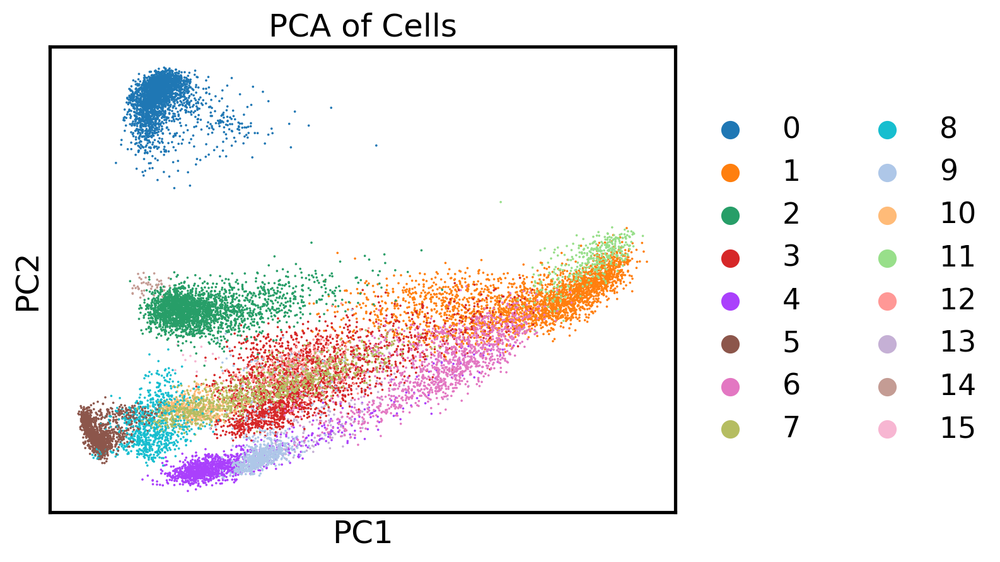

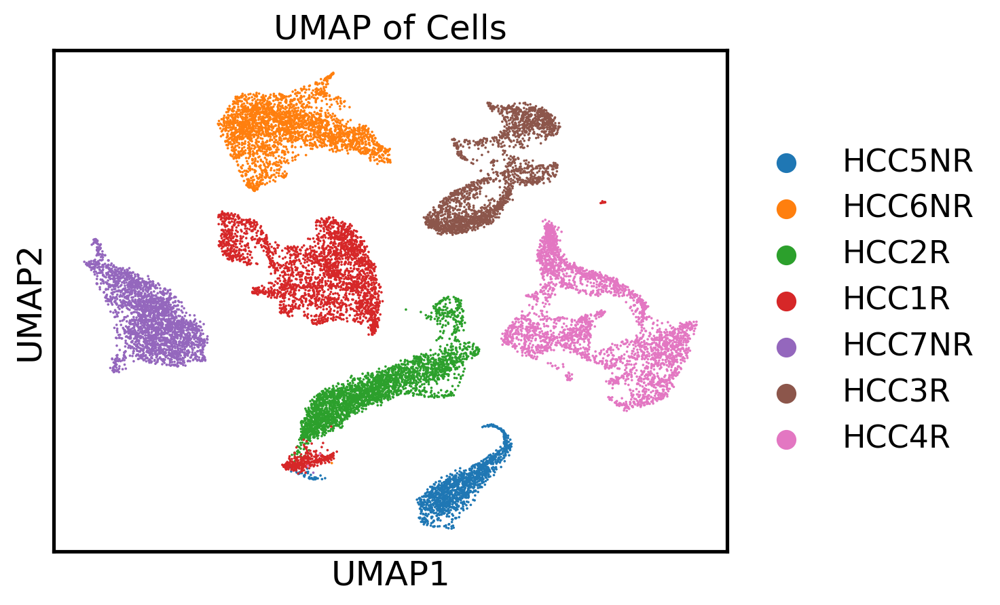

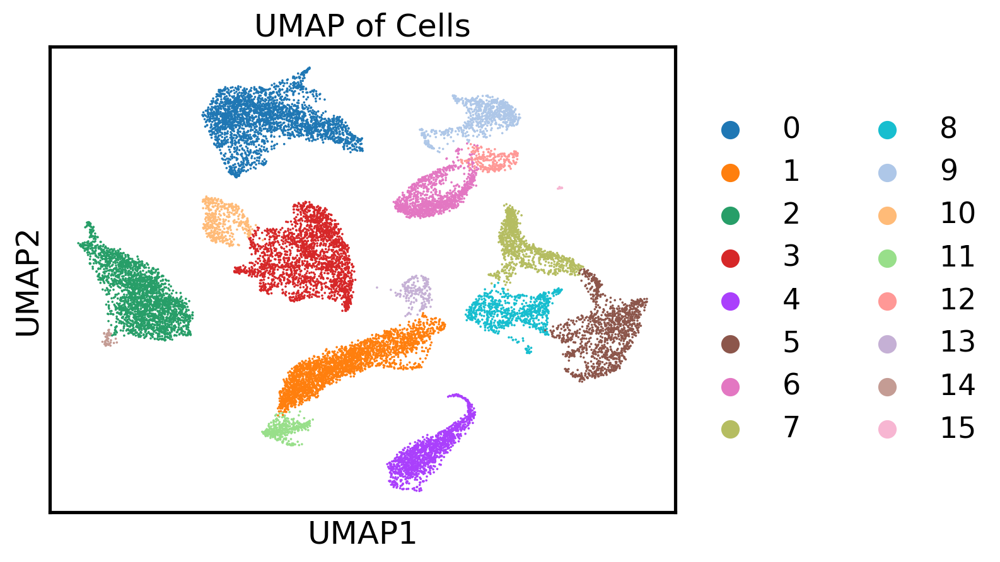

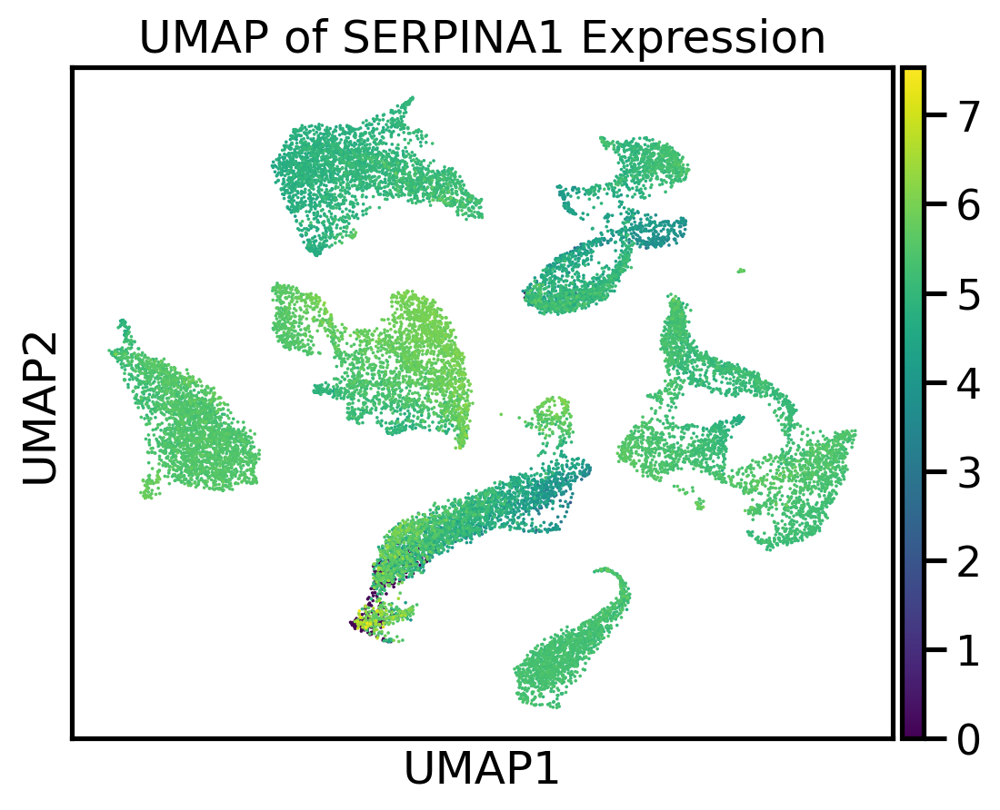

In [32]:
# Step3. Normalization; PCA; UMAP; Clustering; Visualization

# Assuming you already have your AnnData object named adata
combined_ad = sc.read('data/GSE238264_AnnDataObject.h5ad') # Load the Data Again

# 1. # Normalize, log-transform, and set as primary matrix (Added Recently)
sc.pp.normalize_total(combined_ad, target_sum=1e4)
sc.pp.log1p(combined_ad)
# 1. Normalize the data (log1p performs log(x + 1))
#sc.pp.log1p(combined_ad)

# 2. Perform PCA
sc.tl.pca(combined_ad, svd_solver='arpack')  # 'arpack' or 'randomized'

# 3. UMAP projection
sc.pp.neighbors(combined_ad, n_neighbors=10, n_pcs=40)  # You can adjust n_neighbors and n_pcs
sc.tl.umap(combined_ad)

# 4. Clustering (using the Leiden algorithm)
sc.tl.leiden(combined_ad, resolution=0.5)  # Adjust resolution as needed

# 5. Visualizations
# Scatter plot of single-cell expression levels
# Replace 'gene_of_interest' with the actual gene name you want to visualize
gene_of_interest = 'SERPINA1'  # Change to your specific gene or use a column in adata.obs
sc.pl.scatter(combined_ad, x='center_x', y='center_y', color=gene_of_interest, color_map='viridis', 
              title='Cell Expression Scatter Plot', show=True)

# PCA plot
sc.pl.pca(combined_ad, color='sample', title='PCA of Cells', show=True) # Using Samples
sc.pl.pca(combined_ad, color='leiden', title='PCA of Cells', show=True) # Using Clusters

# UMAP plot
sc.pl.umap(combined_ad, color='sample', title='UMAP of Cells', show=True) # Using Samples
sc.pl.umap(combined_ad, color='leiden', title='UMAP of Cells', show=True) # Using Clusters

# Optional: Plot the expression of a specific gene on UMAP
sc.pl.umap(combined_ad, color=gene_of_interest, title=f'UMAP of {gene_of_interest} Expression', show=True)

# Optionally save the figures
# plt.savefig('scatter_plot.png')
# plt.savefig('pca_plot.png')
# plt.savefig('umap_plot.png')

# Save the AnnData Object data
#combined_ad.write("data/GSE238264_normalized.h5ad") # Save the complete Model

In [31]:
print(combined_ad) # Check what other variables are added to the Object after Step3

AnnData object with n_obs × n_vars = 17292 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'center_x', 'center_y', 'leiden', 'response_category', 'predicted_cell_type'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'sample_colors', 'response_category_colors', 'rank_genes_groups', 'predicted_cell_type_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


In [19]:
# To divide Samples in to the Group - Note: This step needs to be sutomized based on the Sample Names and metadata
# Sample names ends with NR are NonResponder and R are Responder
# Add a new column 'response_category' to classify each sample
combined_ad.obs['response_category'] = combined_ad.obs['sample'].apply(
    lambda x: 'NonResponder' if x.endswith('NR') else 'Responder'
)

# Check to ensure the new column is added and categories are correct
print(combined_ad.obs[['sample', 'response_category']].head())

                           sample response_category
AAACAGAGCGACTCCT-1-HCC5NR  HCC5NR      NonResponder
AAACAGCTTTCAGAAG-1-HCC5NR  HCC5NR      NonResponder
AAACAGGGTCTATATT-1-HCC5NR  HCC5NR      NonResponder
AAACCGGGTAGGTACC-1-HCC5NR  HCC5NR      NonResponder
AAACCTCATGAAGTTG-1-HCC5NR  HCC5NR      NonResponder


<Axes: title={'center': 'UMAP of Cells (Responders vs NonResponders)'}, xlabel='UMAP1', ylabel='UMAP2'>

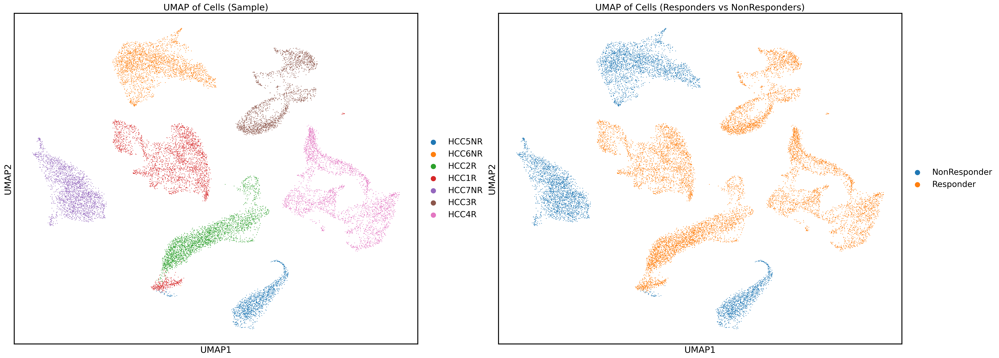

In [20]:
# Print UMAP Again using Sample  and Category
import matplotlib.pyplot as plt
import scanpy as sc
# Create a 1-row, 2-column grid for the plots
fig, axes = plt.subplots(1, 2, figsize=(32, 12))

sc.pl.umap(combined_ad, color='sample', title='UMAP of Cells (Sample)', ax=axes[0], show=False)
sc.pl.umap(combined_ad, color='response_category', title='UMAP of Cells (Responders vs NonResponders)', ax=axes[1], show=False)

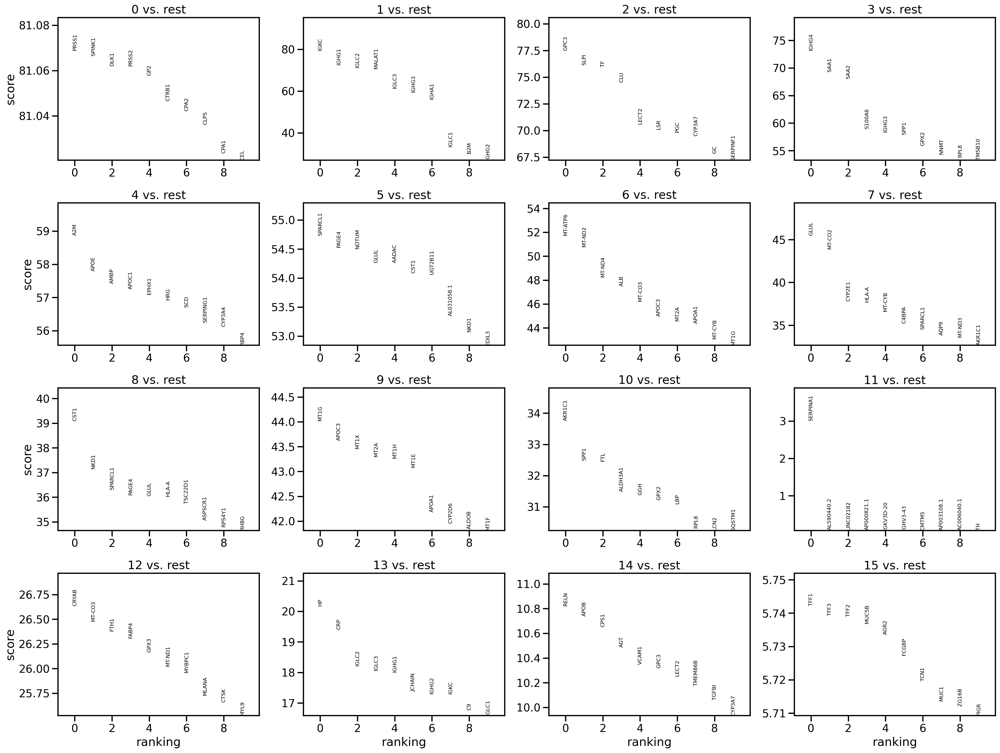

In [21]:
# Step4. Identify most distinctive genes Cluster Specific Marker Genes - using differential expression analysis
# Calculate Marker Gene Expression

sc.tl.rank_genes_groups(combined_ad, groupby="leiden", method="wilcoxon")
sc.pl.rank_genes_groups(combined_ad, n_genes=10, sharey=False)

#This gives you the most distinctive genes per cluster, which you can compare against known marker genes in your reference.

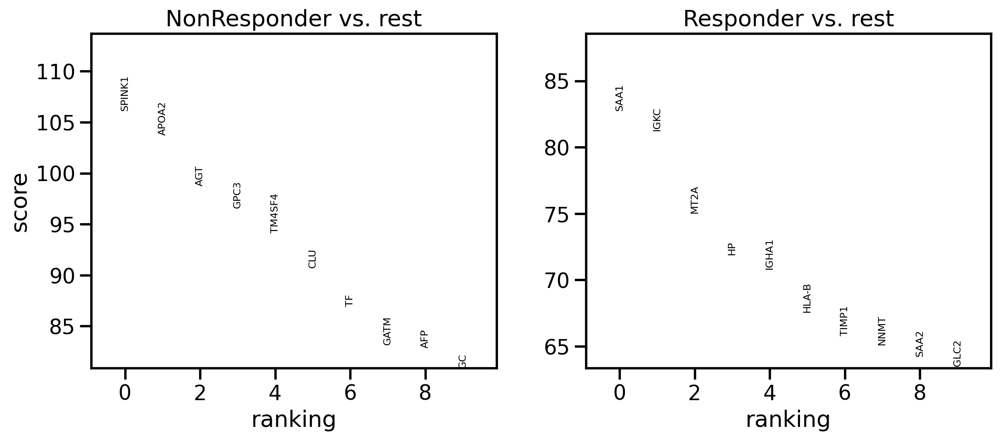

In [22]:
# Identify most distinctive genes between Reponder and NonReponder (Marker Genes) (Optional) - Study Specific
# Calculate Marker Gene Expression

sc.tl.rank_genes_groups(combined_ad, groupby="response_category", method="wilcoxon")
sc.pl.rank_genes_groups(combined_ad, n_genes=10, sharey=False)

#This gives you the most distinctive genes per response category, which you can compare against known marker genes in your reference.

['SPINK1' 'SAA1' 'APOA2' 'IGKC' 'AGT' 'MT2A' 'GPC3' 'HP' 'TM4SF4' 'IGHA1'
 'CLU' 'HLA-B' 'TF' 'TIMP1' 'GATM' 'NNMT' 'AFP' 'SAA2' 'GC' 'IGLC2']


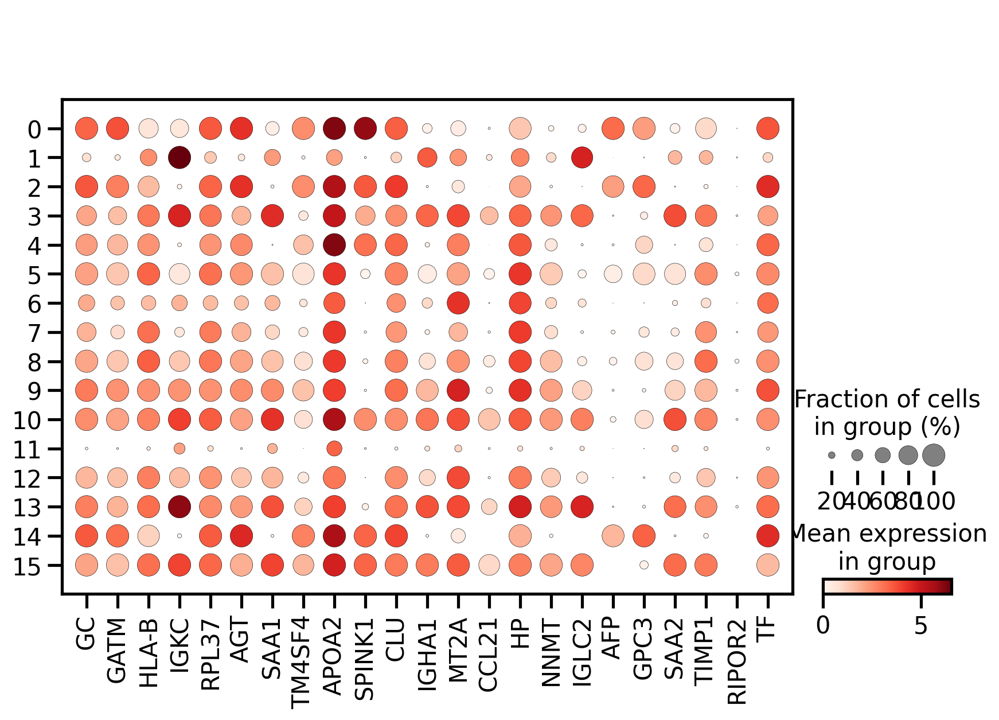

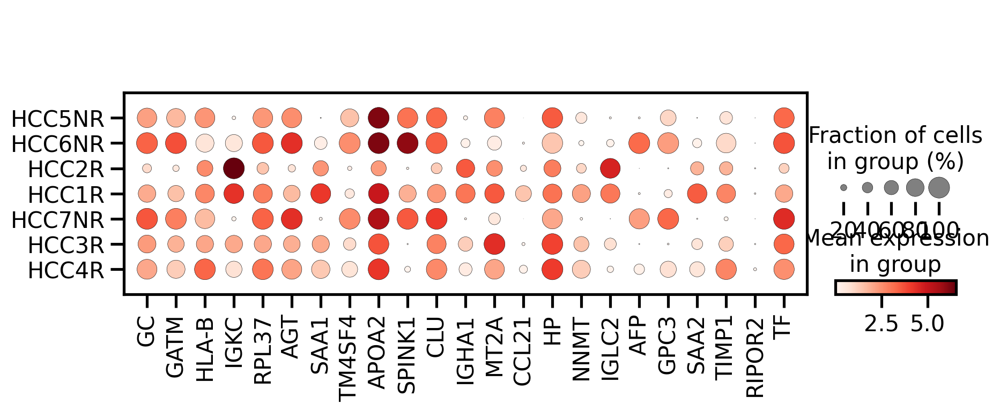

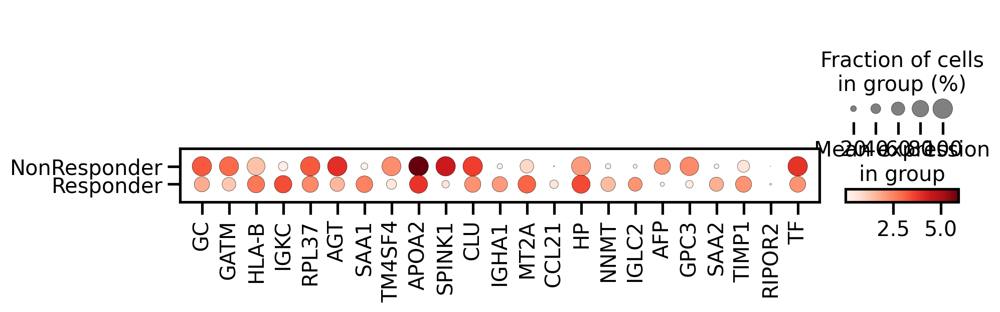

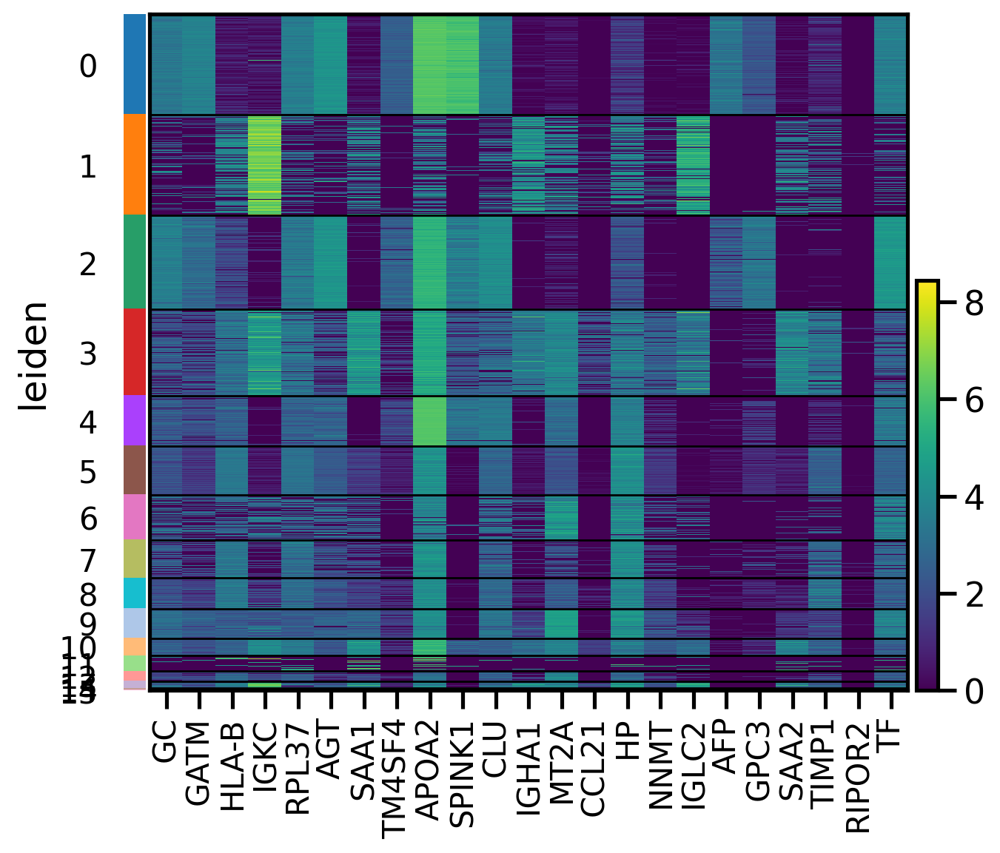

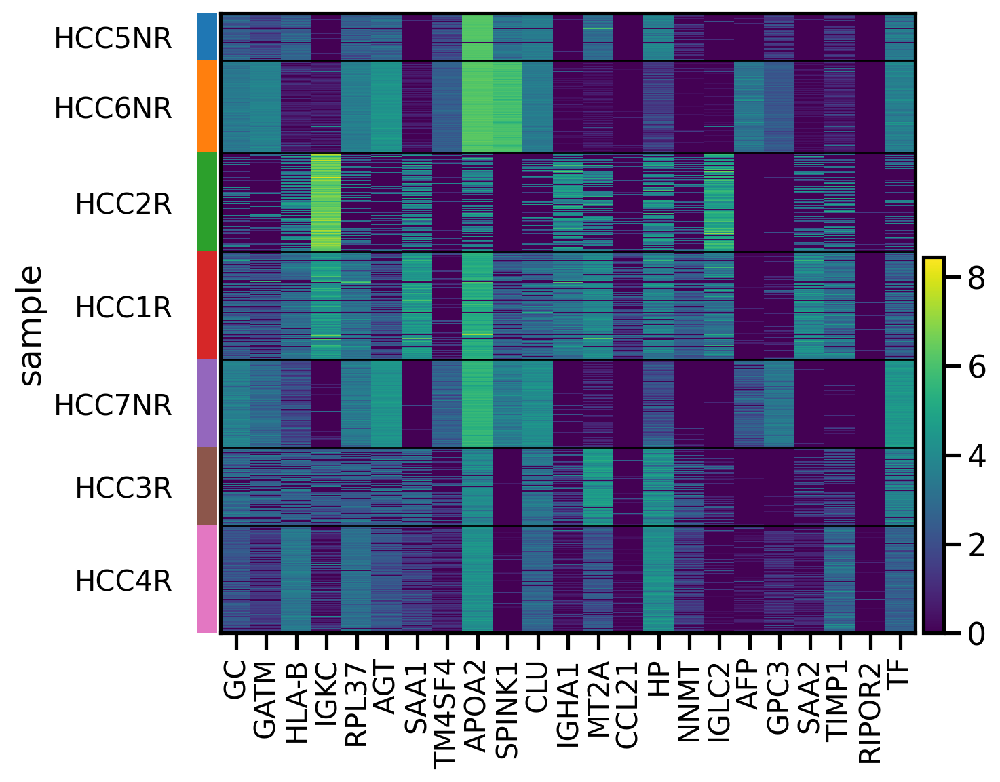

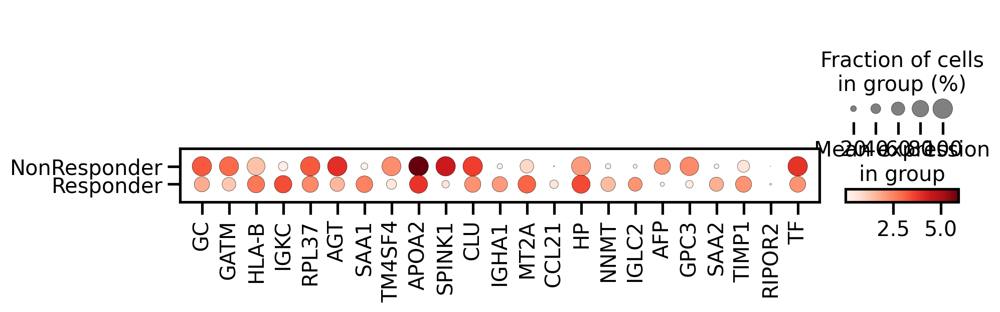

In [23]:
# Plot the Marker genes Identified in Step 4

#'combined_ad' is the AnnData object
#sc.tl.rank_genes_groups(combined_ad, groupby="leiden", method="wilcoxon")
#sc.pl.rank_genes_groups(combined_ad, n_genes=10, sharey=False)

# Extract the ranked genes into a DataFrame
markers = combined_ad.uns['rank_genes_groups']['names']

# Convert to DataFrame
markers_df = pd.DataFrame(markers)

# Select top 3 markers from each group
top_markers = markers_df.iloc[:10, :].values.flatten()

# Remove duplicates and get unique markers
top_markers_unique = pd.unique(top_markers)

# Display the top markers
print(top_markers_unique)

manual_markers = ["RPL37", "CCL21", "RIPOR2"] # Cluster specific If I want to include

# Combine top markers with manual markers
final_markers = list(set(top_markers_unique).union(set(manual_markers)))

# Create DotPlot
sc.pl.dotplot(combined_ad, var_names=final_markers, groupby="leiden", use_raw=False)
sc.pl.dotplot(combined_ad, var_names=final_markers, groupby="sample", use_raw=False) # Group by Samples
sc.pl.dotplot(combined_ad, var_names=final_markers, groupby="response_category", use_raw=False) # Group by response_category

# Create Heatmap
sc.pl.heatmap(combined_ad, var_names=final_markers, groupby="leiden", use_raw=False, cmap='viridis')
sc.pl.heatmap(combined_ad, var_names=final_markers, groupby="sample", use_raw=False, cmap='viridis') # Group by Samples
sc.pl.dotplot(combined_ad, var_names=final_markers, groupby="response_category", use_raw=False) # Group by response_category

In [24]:
# Step5: Cell Type Annotation using Cell Typist
# -- Manual
# -- Using Cell Typist
# Get HealthY Liver Datasets

#!pip3 install celltypist
import os
import celltypist
# List all models that are available for use in CellTypist
available_models = celltypist.models.get_all_models()
print("Available models:", available_models)

## Download the model if it's missing
#celltypist.models.download_models(model="Mouse_Whole_Brain")

## Check the CELLTYPIST_HOME variable to see where models are stored by default
#model_directory = os.getenv("CELLTYPIST_HOME", "~/.celltypist/data/models/")
#print("Default CellTypist model directory:", os.path.expanduser(model_directory))

# Set the directory path to the location where you found the models
model_path = '/Users/sharmaa4/.celltypist/data/models/Healthy_Human_Liver.pkl'  # Healthy Human Liver Model

## Use CellTypist to predict cell types
predictions = celltypist.annotate(combined_ad, model=model_path)
combined_ad.obs["predicted_cell_type"] = predictions.predicted_labels

🔬 Input data has 17292 cells and 36601 genes
🔗 Matching reference genes in the model


Available models: ['Lethal_COVID19_Lung.pkl', 'Cells_Human_Tonsil.pkl', 'Fetal_Human_Pancreas.pkl', 'Human_Longitudinal_Hippocampus.pkl', 'Human_IPF_Lung.pkl', 'Human_Lung_Atlas.pkl', 'Mouse_Isocortex_Hippocampus.pkl', 'Developing_Mouse_Brain.pkl', 'Adult_Human_Skin.pkl', 'Immune_All_High.pkl', 'Mouse_Postnatal_DentateGyrus.pkl', 'Adult_Human_PrefrontalCortex.pkl', 'Cells_Lung_Airway.pkl', 'Developing_Human_Brain.pkl', 'Cells_Fetal_Lung.pkl', 'Developing_Human_Organs.pkl', 'Cells_Intestinal_Tract.pkl', 'Developing_Human_Gonads.pkl', 'Human_Embryonic_YolkSac.pkl', 'Developing_Human_Thymus.pkl', 'Fetal_Human_Pituitary.pkl', 'Adult_Human_PancreaticIslet.pkl', 'Developing_Human_Hippocampus.pkl', 'Human_Placenta_Decidua.pkl', 'Human_Developmental_Retina.pkl', 'Adult_Mouse_Gut.pkl', 'Healthy_Mouse_Liver.pkl', 'Adult_Pig_Hippocampus.pkl', 'Healthy_Adult_Heart.pkl', 'Human_AdultAged_Hippocampus.pkl', 'Fetal_Human_AdrenalGlands.pkl', 'Mouse_Whole_Brain.pkl', 'Fetal_Human_Skin.pkl', 'COVID19_Hum

🧬 2514 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [25]:
combined_ad.obs["predicted_cell_type"]

AAACAGAGCGACTCCT-1-HCC5NR    Hepatocytes
AAACAGCTTTCAGAAG-1-HCC5NR    Hepatocytes
AAACAGGGTCTATATT-1-HCC5NR    Hepatocytes
AAACCGGGTAGGTACC-1-HCC5NR    Hepatocytes
AAACCTCATGAAGTTG-1-HCC5NR    Hepatocytes
                                ...     
TTGTTGTGTGTCAAGA-1-HCC4R     Fibroblasts
TTGTTTCACATCCAGG-1-HCC4R     Hepatocytes
TTGTTTCATTAGTCTA-1-HCC4R     Hepatocytes
TTGTTTCCATACAACT-1-HCC4R     Hepatocytes
TTGTTTGTGTAAATTC-1-HCC4R     Hepatocytes
Name: predicted_cell_type, Length: 17292, dtype: category
Categories (14, object): ['B cells', 'Basophils', 'Cholangiocytes', 'Circulating NK/NKT', ..., 'Plasma cells', 'Resident NK', 'T cells', 'cDC2s']

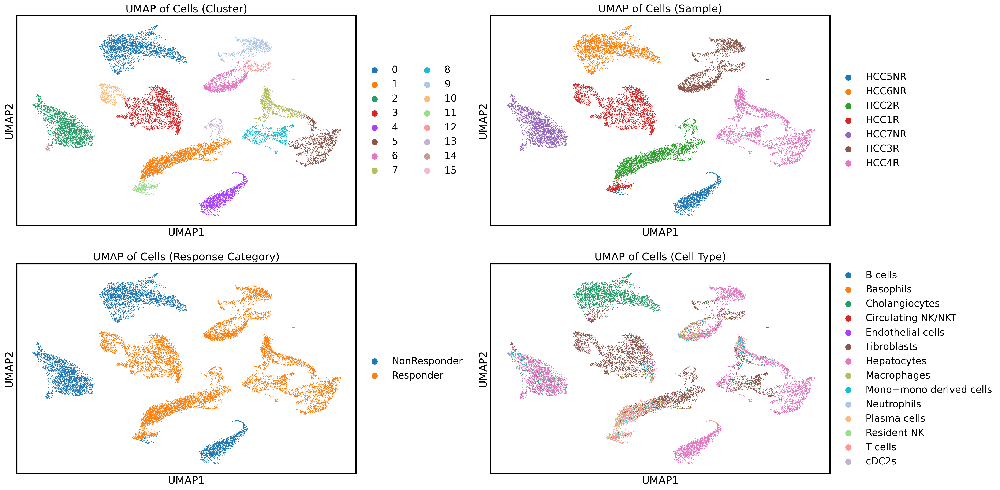

In [27]:
# UMAP plots 1:1 Comparisons

# Create a 2x2 grid for the plots
fig, axes = plt.subplots(2, 2, figsize=(24, 12))
# Plot 1: Cluster-specific UMAP
sc.pl.umap(combined_ad, color='leiden', title='UMAP of Cells (Cluster)', ax=axes[0, 0], show=False)
# Plot 2: Sample-specific UMAP
sc.pl.umap(combined_ad, color='sample', title='UMAP of Cells (Sample)', ax=axes[0, 1], show=False)
# Plot 3: Response category UMAP
sc.pl.umap(combined_ad, color='response_category', title='UMAP of Cells (Response Category)', ax=axes[1, 0], show=False)
# Plot 4: Cell type-specific UMAP
sc.pl.umap(combined_ad, color='predicted_cell_type', title='UMAP of Cells (Cell Type)', ax=axes[1, 1], show=False)
# Adjust layout
plt.tight_layout()
plt.show()

In [112]:
# Save the Analzyed data
# combined_ad.write("data/GSE238264_finalProcessedData.h5ad")

# We can load this again
#combined_ad = sc.read('data/GSE238264_finalProcessedData.h5ad') # Load the Data Again

In [15]:
# If we are using other annotation methods - to Quickly compare.
# Quantitative Validation Metrics
#Confusion Matrix: If you have a ground truth dataset or annotations from multiple methods, you can compute confusion matrices to evaluate the agreement between annotations.
#Adjusted Rand Index (ARI) or Normalized Mutual Information (NMI): Calculate ARI or NMI between annotations if you have a reference or high-confidence annotations.

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
# Load Annotated data: Annotations were completed in 
combined_ad = sc.read("data/GSE238264_normalized_liver_annotations.h5ad") # Only Normaliztion

# Example: ARI between CellTypist and SingleR annotations
ari_score = adjusted_rand_score(combined_ad.obs["predicted_cell_type"], combined_ad.obs["SingleR_annotation"])
print("Adjusted Rand Index:", ari_score)

Adjusted Rand Index: -0.05326895111585287
